In [1]:
import pickle 
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns  
import plotly.express as px

from sklearn.model_selection import train_test_split, KFold 
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

import patsy
import scipy.stats as stats

import statsmodels.api as sm
import statsmodels.formula.api as smf

#Settings
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
pd.options.display.max_columns = None
pd.options.display.float_format = '{:.2f}'.format
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', 500)
from IPython.core.interactiveshell import InteractiveShell  
InteractiveShell.ast_node_interactivity = "all"
seed =123

In [5]:
with open('../data/processed/selected_flats_modeling_df.pkl', 'rb') as read_file:
    selected_flats_model_df_final = pickle.load(read_file)

In [6]:
#log transform price since it was found to be slightly left skewed from 02-Cleaning notebook, and residuals had 
#high kurtosis and skewness
selected_flats_model_df_final['Asking_log'] = np.log(selected_flats_model_df_final['Asking'])
selected_flats_model_df_final.shape
selected_flats_model_df_final.head(1)


(1156, 128)

,Asking,PSF,Bedrooms,Bathrooms,Corner Unit,Renovated,Air Conditioning,Water Heater,Cooker Hob/hood,Balcony,Original Condition,Hairdryer,City View,Bombshelter,Park/greenery View,Walk-in-wardrobe,Maidsroom,Intercom,Sea View,Colonial Building,Bathtub,Private Garden,Outdoor Patio,Terrace,Private Lift,Meeting Rooms,Roof Terrace,Swimming Pool View,Age,Property_Type_label_encoded,Property Type_HDB 4 Rooms,Property Type_HDB 5 Rooms,Property Type_HDB Executive,Property Type_HDB Jumbo,Model_edited_Apartment,Model_edited_Apartment,Model_edited_Dbss,Model_edited_Dbss,Model_edited_Design & Built,Model_edited_Design & Built,Model_edited_Executive Apartment,Model_edited_Executive Apartment,Model_edited_Improved,Model_edited_Improved,Model_edited_Jumbo,Model_edited_Jumbo,Model_edited_Maisonette,Model_edited_Maisonette,Model_edited_Model A,Model_edited_Model A,Model_edited_Multi Generation,Model_edited_Multi Generation,Model_edited_New Generation,Model_edited_New Generation,Model_edited_Others,Model_edited_Others,Model_edited_Premium Apartment,Model_edited_Premium Apartment,Model_edited_Simplified,Model_edited_Simplified,Model_edited_Standard,Model_edited_Standard,Model_edited_Terrace,Model_edited_Terrace,Model_edited_Apartment,Model_edited_Apartment,Model_edited_Dbss,Model_edited_Dbss,Model_edited_Design & Built,Model_edited_Design & Built,Model_edited_Executive Apartment,Model_edited_Executive Apartment,Model_edited_Improved,Model_edited_Improved,Model_edited_Jumbo,Model_edited_Jumbo,Model_edited_Maisonette,Model_edited_Maisonette,Model_edited_Model A,Model_edited_Model A,Model_edited_Multi Generation,Model_edited_Multi Generation,Model_edited_New Generation,Model_edited_New Generation,Model_edited_Others,Model_edited_Others,Model_edited_Premium Apartment,Model_edited_Premium Apartment,Model_edited_Simplified,Model_edited_Simplified,Model_edited_Standard,Model_edited_Standard,Model_edited_Terrace,Model_edited_Terrace,Furnish_1,Furnish_2,Furnish_3,HDB Town_Bedok,HDB Town_Bishan,HDB Town_Bukit Batok,HDB Town_Bukit Merah,HDB Town_Bukit Panjang,HDB Town_Bukit Timah,HDB Town_Central Area,HDB Town_Choa Chu Kang,HDB Town_Clementi,HDB Town_Geylang,HDB Town_Hougang,HDB Town_Jurong East,HDB Town_Jurong West,HDB Town_Kallang/Whampoa,HDB Town_Marine Parade,HDB Town_Pasir Ris,HDB Town_Punggol,HDB Town_Queenstown,HDB Town_Sembawang,HDB Town_Sengkang,HDB Town_Serangoon,HDB Town_Tampines,HDB Town_Toa Payoh,HDB Town_Woodlands,HDB Town_Yishun,Land Tenure_LEASEHOLD/99 years,HDB_Region_East,HDB_Region_North,HDB_Region_North_East,HDB_Region_West,Asking_log
0,560000.00,366.00,4,2,1.00,1.00,1.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,23,6,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,13.24


In [4]:
selected_flats_model_df_final_num = selected_flats_model_df_final.select_dtypes(include = ['float64', 'int64'])
selected_flats_model_df_final_num.columns

Index(['Asking', 'PSF', 'Bedrooms', 'Corner Unit', 'Renovated',
       'Air Conditioning', 'Water Heater', 'Cooker Hob/hood', 'Balcony',
       'Original Condition', 'Hairdryer', 'City View', 'Bombshelter',
       'Park/greenery View', 'Walk-in-wardrobe', 'Maidsroom', 'Intercom',
       'Sea View', 'Colonial Building', 'Bathtub', 'Private Garden',
       'Outdoor Patio', 'Terrace', 'Private Lift', 'Meeting Rooms',
       'Roof Terrace', 'Swimming Pool View', 'Age', 'Asking_log'],
      dtype='object')

<Figure size 864x720 with 0 Axes>

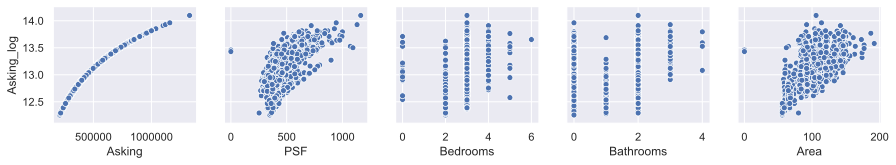

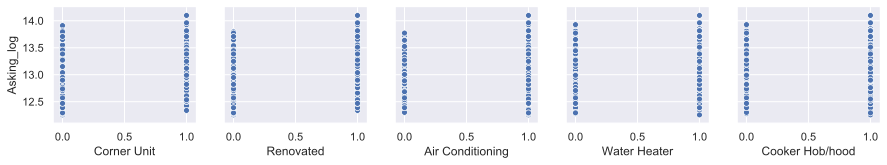

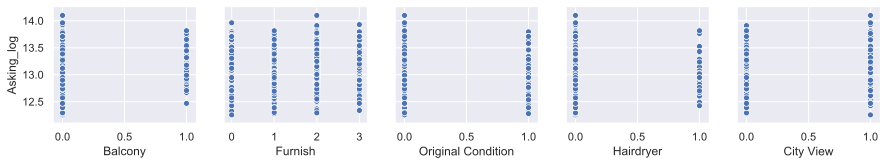

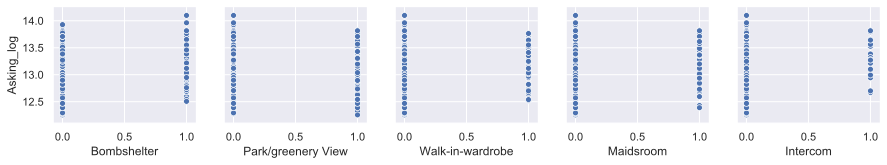

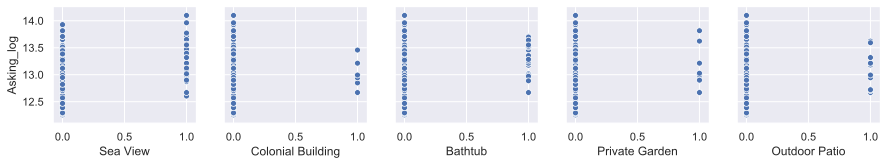

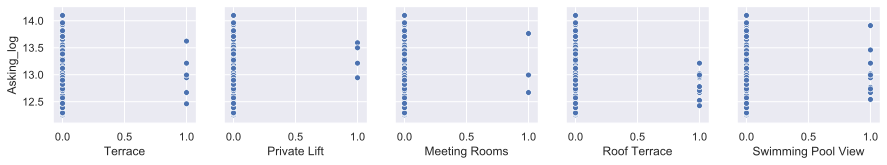

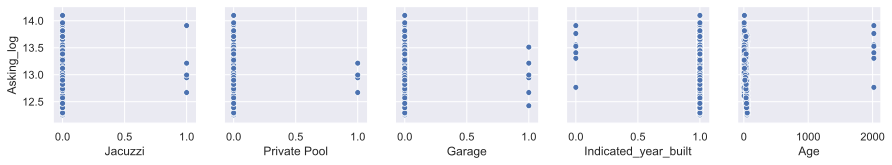

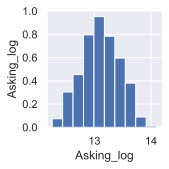

In [191]:
#inspect the relationship between target and numerical variables
fig = plt.figure(figsize=(12,10))
sns.set()
for i in range(0, len(selected_flats_model_df_final_num.columns), 5):
    ax = sns.pairplot(data=selected_flats_model_df_final_num,
                x_vars=selected_flats_model_df_final_num.columns[i:i+5],
                y_vars=['Asking_log'])
# ax.set_title('Pairplot of Asking price against features')
plt.tight_layout()  
# fig.savefig('../reports/figures/target_against_features.png', dpi=600)
plt.show();

In [213]:
selected_flats_model_df_final.loc[selected_flats_model_df_final['Private Lift']==1]

,Property Type,Asking,PSF,Built Year,HDB Town,Bedrooms,Bathrooms,Land Tenure,Corner Unit,Renovated,Air Conditioning,Water Heater,Cooker Hob/hood,Balcony,Furnish,Original Condition,Hairdryer,City View,Bombshelter,Park/greenery View,Walk-in-wardrobe,Maidsroom,Intercom,Sea View,Colonial Building,Bathtub,Private Garden,Outdoor Patio,Terrace,Private Lift,Meeting Rooms,Roof Terrace,Swimming Pool View,Jacuzzi,Model_edited,Indicated_year_built,Age,HDB_Region,Asking_log
103,HDB 5 Rooms,800000.00,563.00,1992,Bishan,0,4,LEASEHOLD/99 years,1.00,1.00,1.00,0.00,1.00,0.00,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,Model A,1,28.00,Central,13.59
395,HDB 5 Rooms,548000.00,424.00,1998,Jurong West,3,2,LEASEHOLD/99 years,1.00,1.00,1.00,1.00,1.00,1.00,3,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00,1.00,Model A,1,22.00,West,13.21
511,HDB 4 Rooms,418000.00,431.00,2000,Jurong West,3,2,LEASEHOLD/99 years,1.00,1.00,1.00,1.00,1.00,1.00,3,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00,1.00,Model A,1,20.00,West,12.94
720,HDB 5 Rooms,728000.00,559.00,1984,Bishan,3,2,LEASEHOLD/99 years,1.00,1.00,1.00,1.00,1.00,0.00,2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,Improved,1,36.00,Central,13.50


In [195]:
#inspect the relationship between numerical features
selected_columnns_pairplot = ['PSF', 'Bedrooms', 'Bathrooms', 'Area', 'Age', 'Indicated_year_built', 'Asking_log']
sns.pairplot(selected_flats_model_df_final_num[selected_columnns_pairplot], height=1.2, aspect=1.5);


In [9]:
selected_flats_model_df_final["Asking_log"].describe()

count   1155.00
mean    13.11  
std     0.33   
min     12.25  
25%     12.88  
50%     13.10  
75%     13.35  
max     14.10  
Name: Asking_log, dtype: float64

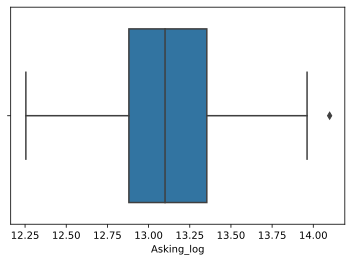

In [11]:
sns.boxplot(x=selected_flats_model_df_final["Asking_log"]);
#clip Asking_log price between 12.25 and 13.96

In [29]:
X = selected_flats_model_df_final.drop('Asking_log',axis = 1).astype(float)
y = selected_flats_model_df_final['Asking_log'].astype(float)

In [30]:
#Split the data 60 - 20 - 20 train/val/test

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2,random_state=seed)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=.25, random_state=seed)

In [35]:
X_train_val['Age'].describe()


count    924.000000 
mean     36.128788  
std      147.032155 
min      4.000000   
25%      15.750000  
50%      27.000000  
75%      36.000000  
max      2020.000000
Name: Age, dtype: float64

36.128787878787875

In [38]:
#listings that didn't indicate year it was built were coded to be 0 in 02-cleaning notebook, hence there are 
#age with value of 2010. impute Age of value 2010 with the mean age
X_train_val.loc[X_train_val["Age"] > 2000, 'Age'] = np.mean(X_train_val['Age'])

/Users/admin/anaconda3/envs/metis/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/admin/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
with open('../data/processed/selected_flats_model_df_final.pkl', 'wb') as to_write: #log price
    pickle.dump(selected_flats_model_df_final, to_write)